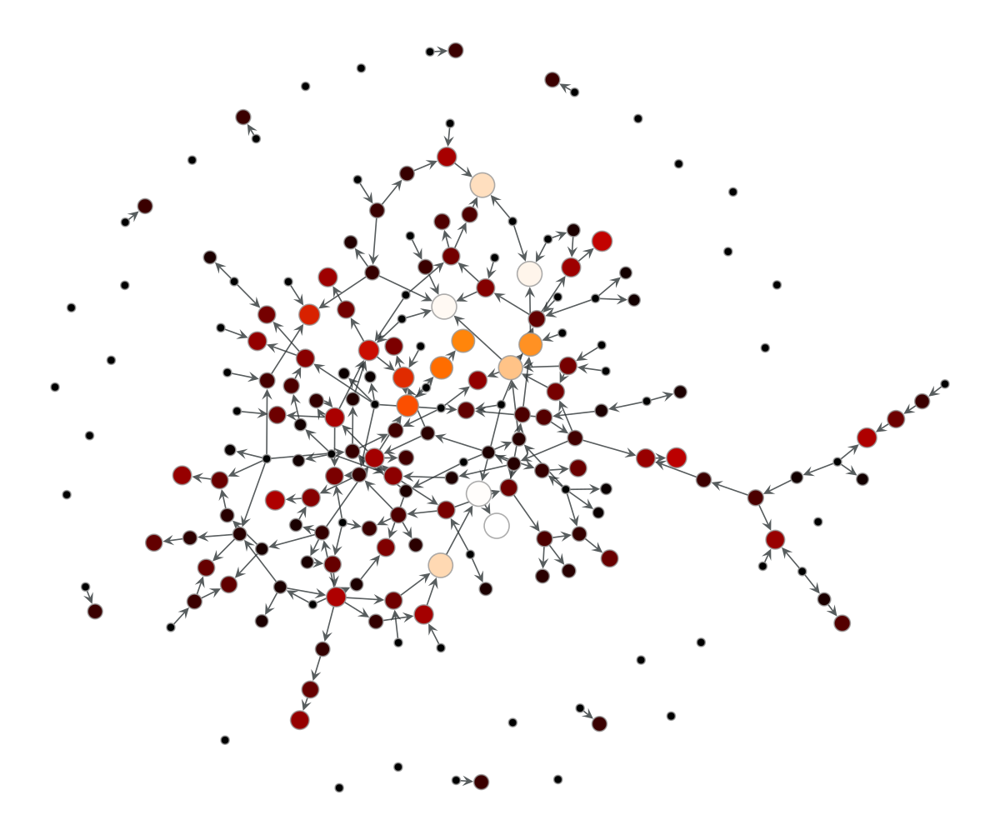

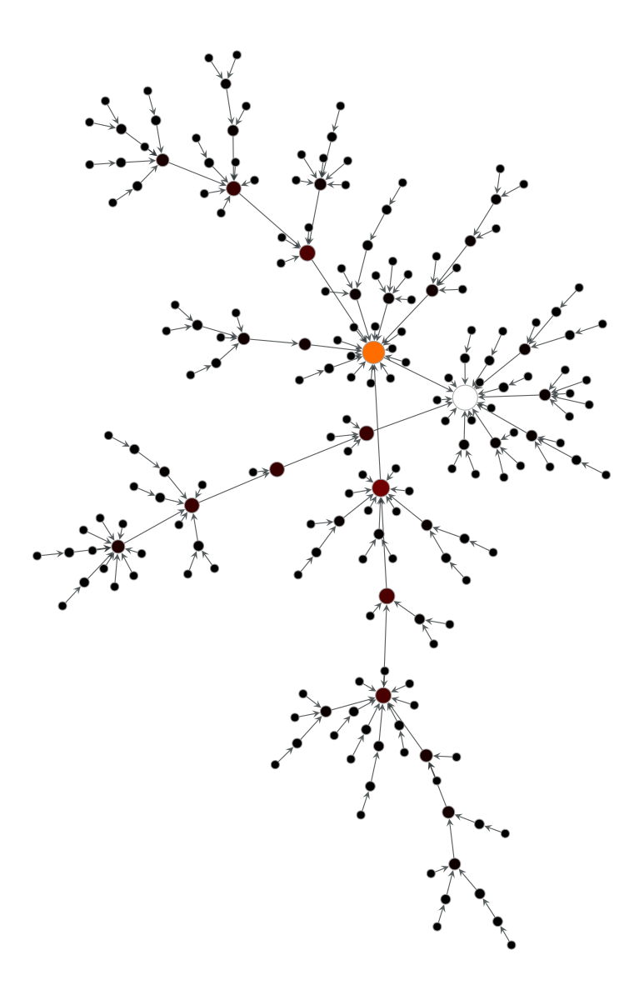

       erdos_renyi  barabasi_albert
count   200.000000       200.000000
mean      0.005000         0.005000
std       0.003115         0.014965
min       0.002545         0.001433
25%       0.002545         0.001433
50%       0.004043         0.001433
75%       0.006372         0.002651
max       0.016412         0.160674


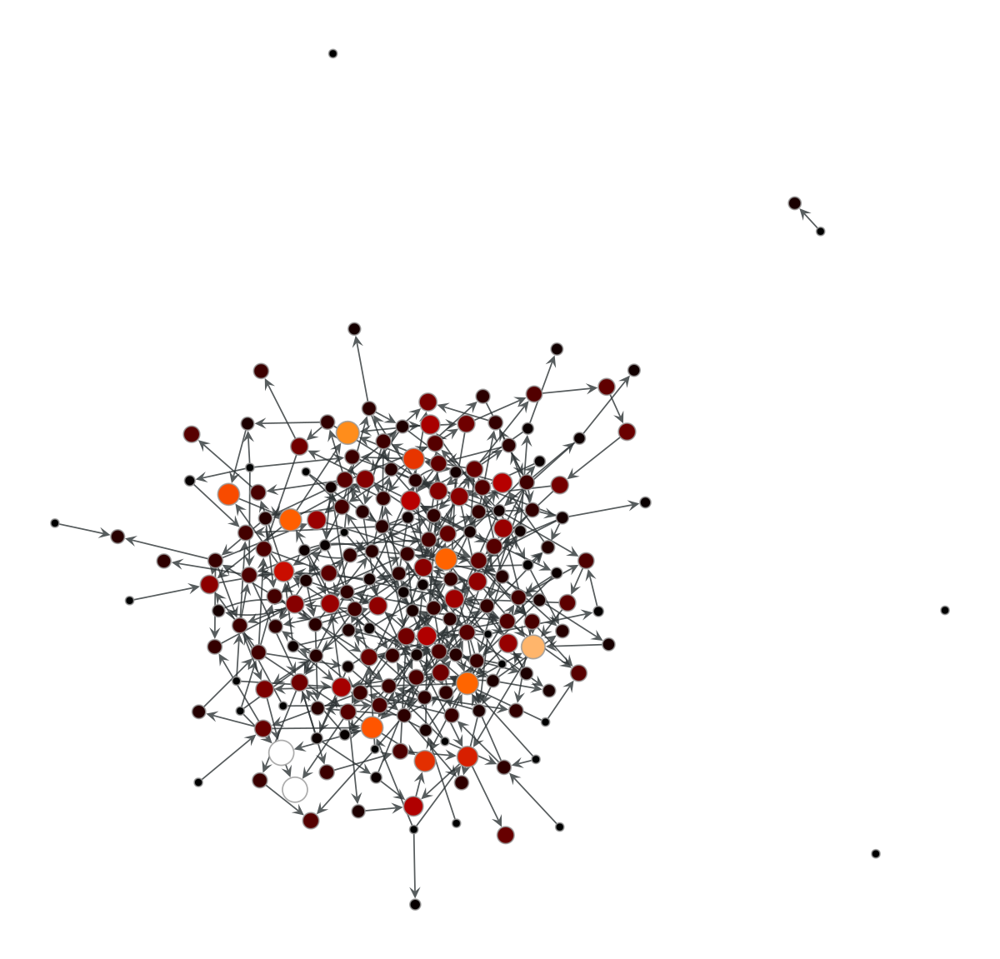

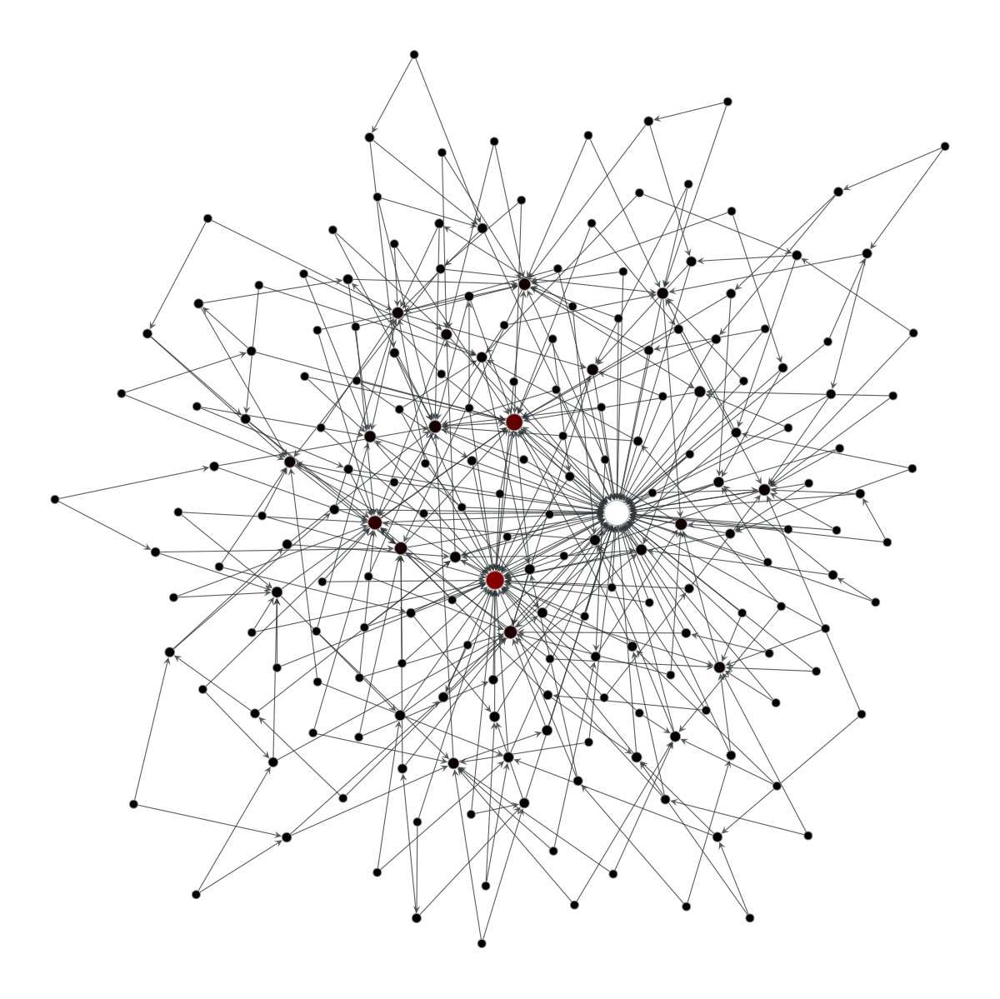

       erdos_renyi  barabasi_albert
count   200.000000       200.000000
mean      0.005000         0.005000
std       0.003533         0.017664
min       0.001505         0.001726
25%       0.002593         0.001726
50%       0.003987         0.001726
75%       0.006079         0.003192
max       0.020524         0.229534


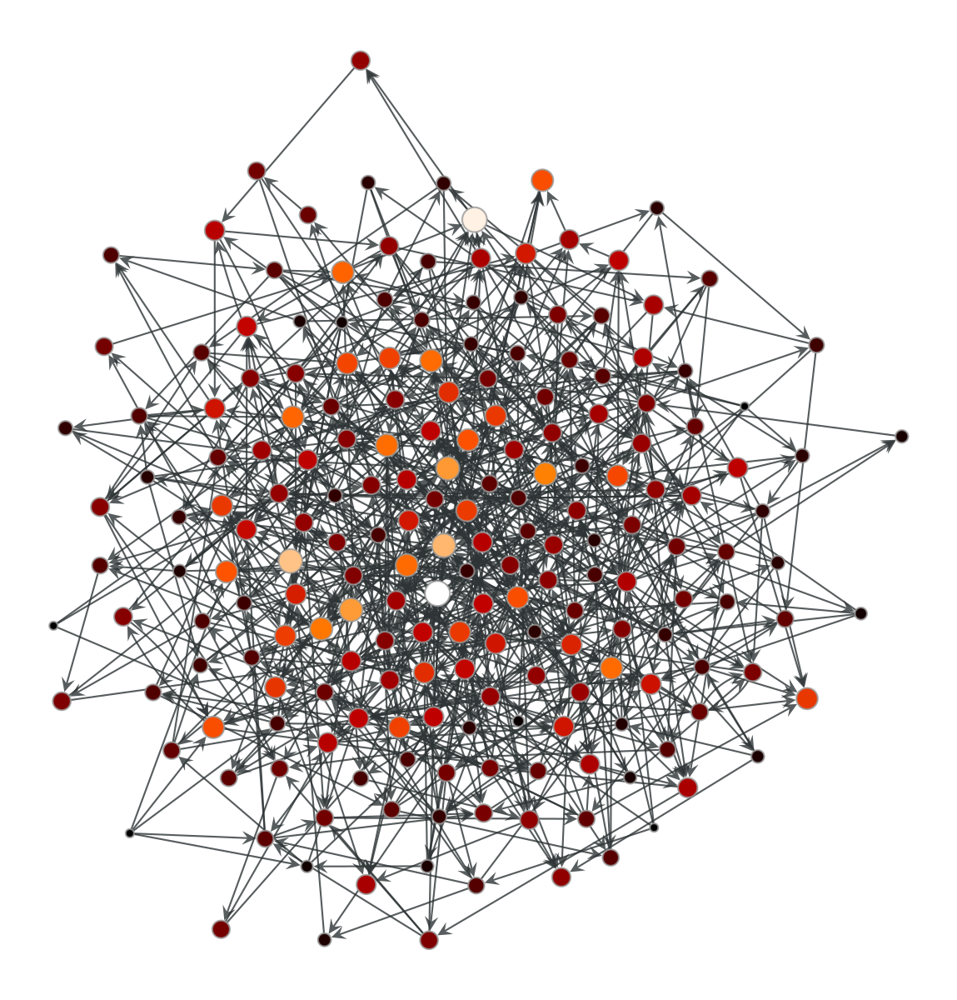

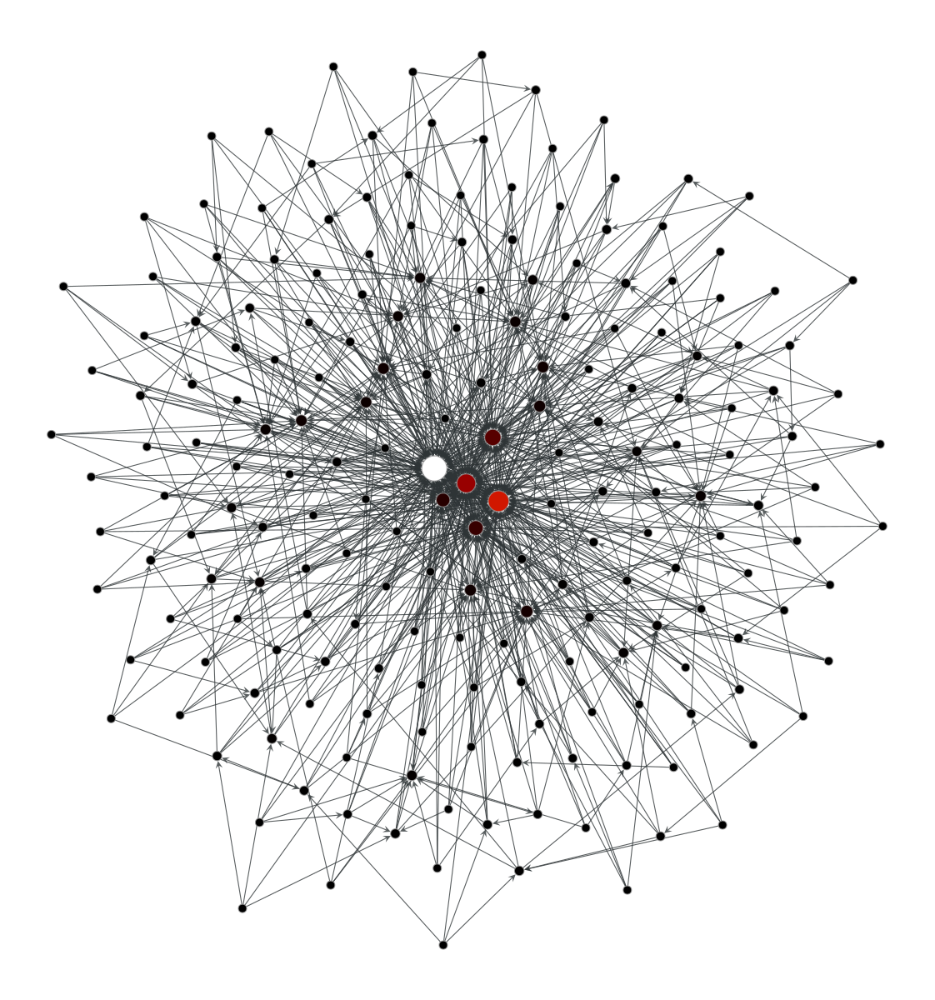

       erdos_renyi  barabasi_albert
count   200.000000       200.000000
mean      0.005000         0.005000
std       0.002382         0.018514
min       0.000862         0.001662
25%       0.003210         0.001662
50%       0.004706         0.001662
75%       0.006601         0.002368
max       0.012563         0.214513


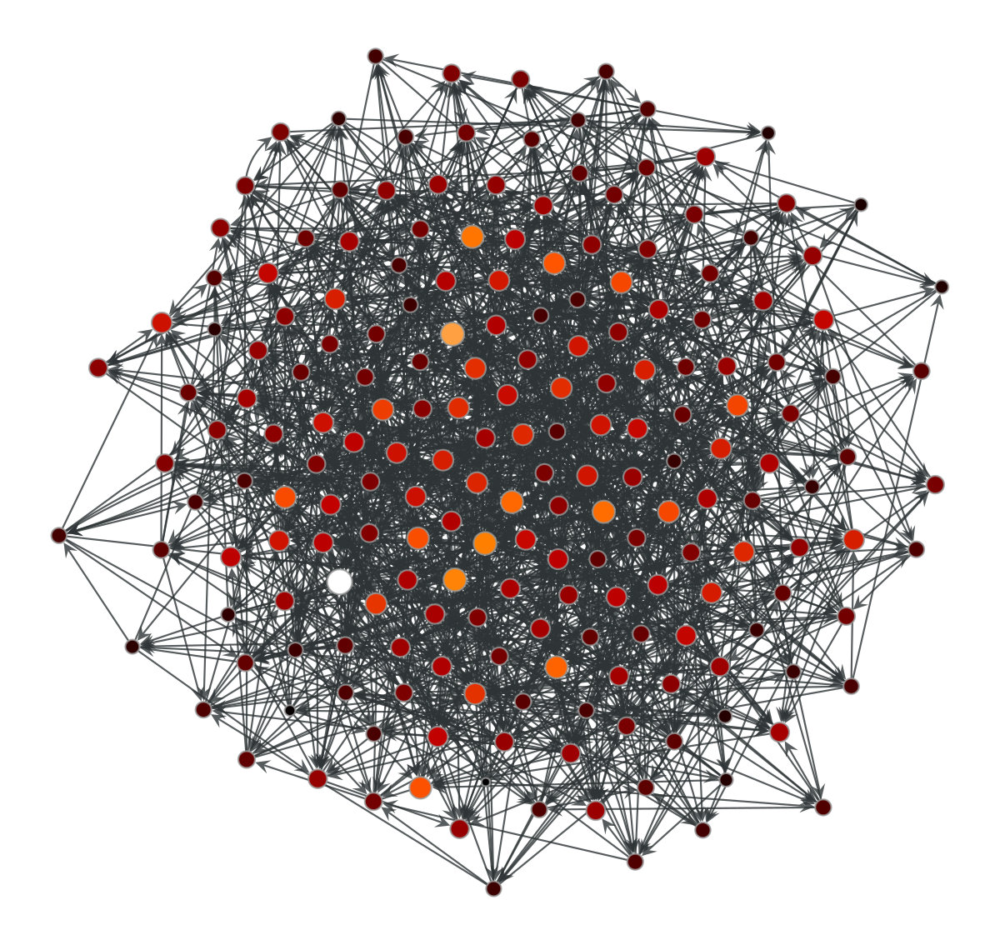

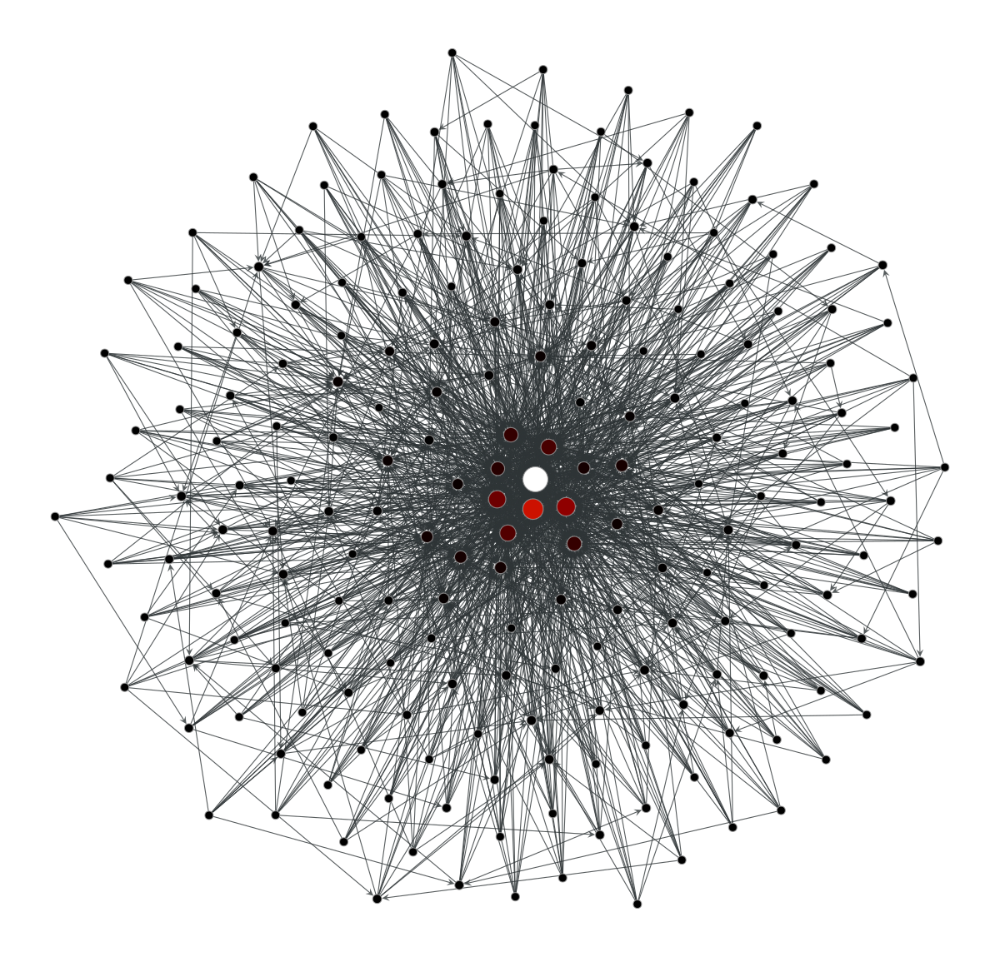

       erdos_renyi  barabasi_albert
count   200.000000       200.000000
mean      0.005000         0.005000
std       0.001724         0.016740
min       0.001156         0.001553
25%       0.003773         0.001553
50%       0.004892         0.001718
75%       0.006240         0.002334
max       0.011509         0.188859


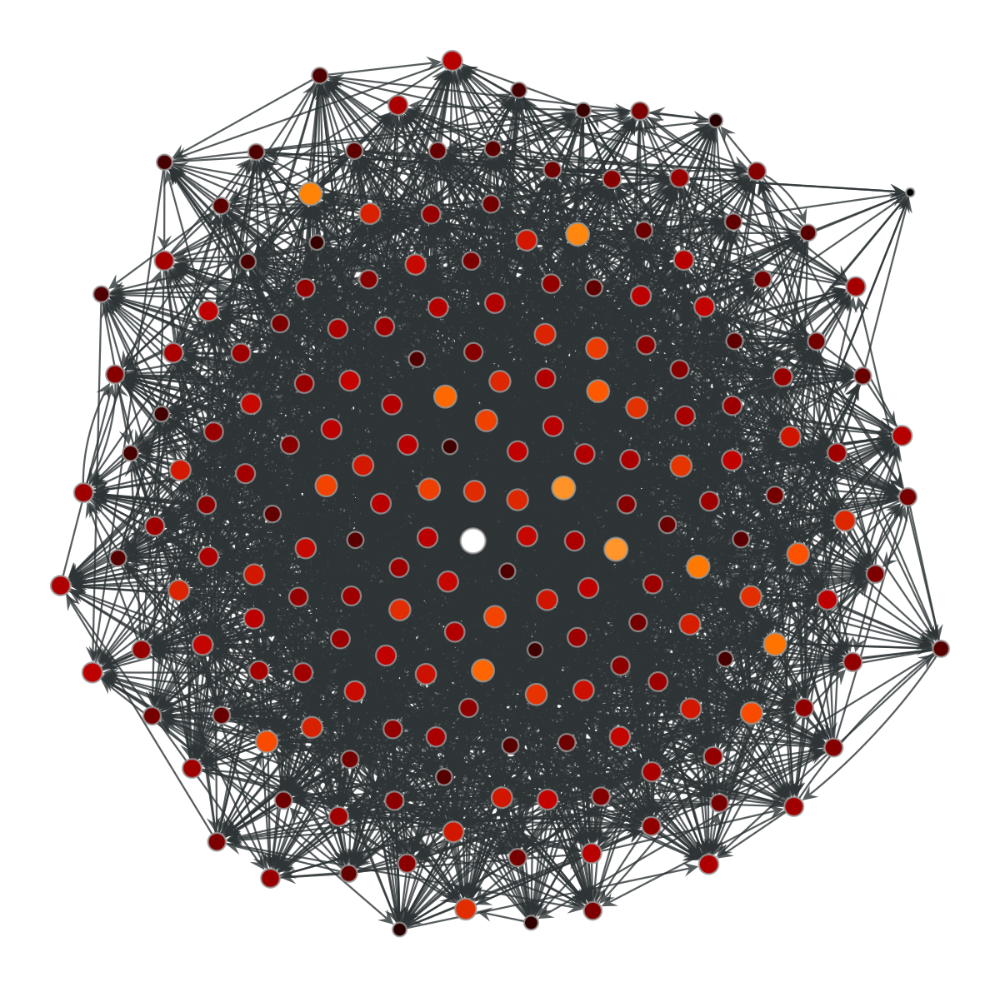

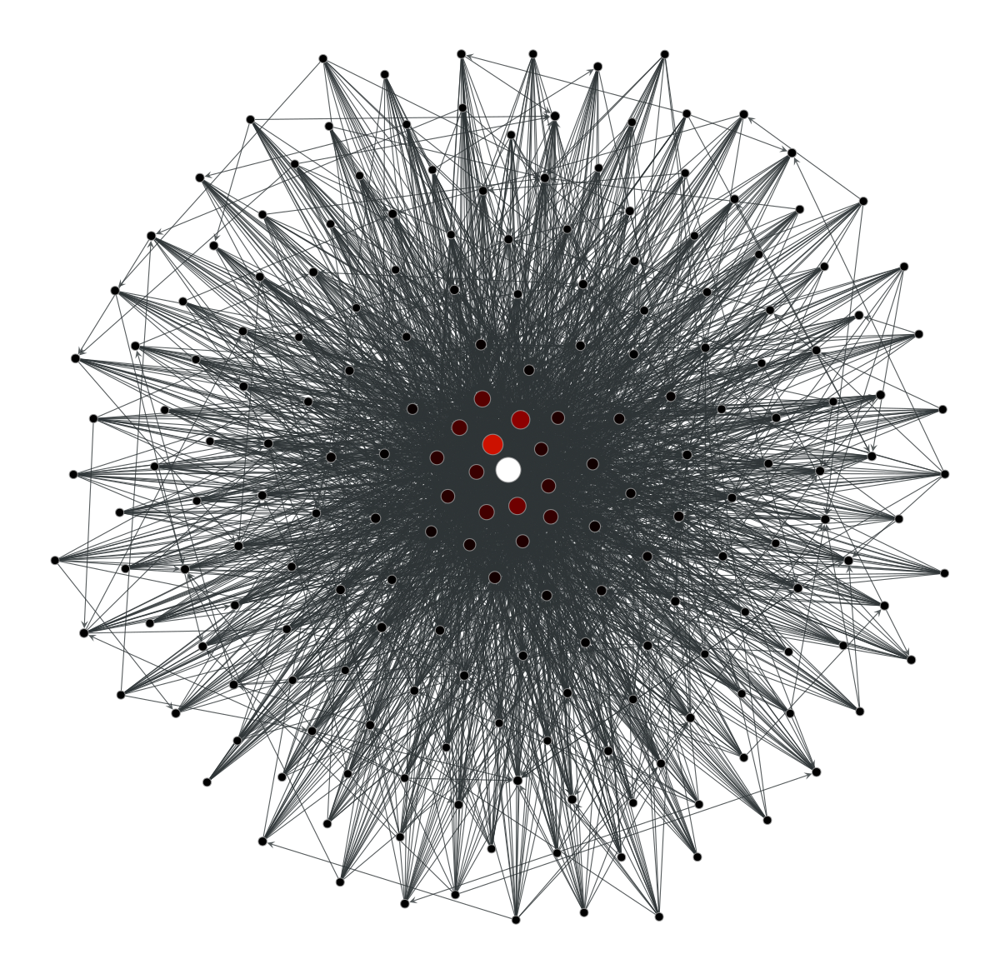

       erdos_renyi  barabasi_albert
count   200.000000       200.000000
mean      0.005000         0.005000
std       0.001073         0.015208
min       0.002030         0.001464
25%       0.004254         0.001464
50%       0.004956         0.001542
75%       0.005656         0.001859
max       0.009117         0.168075


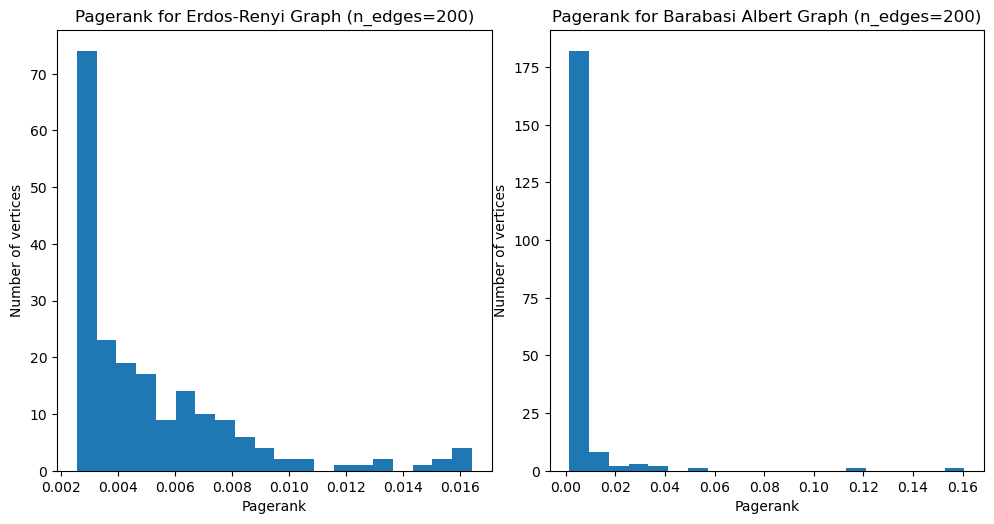

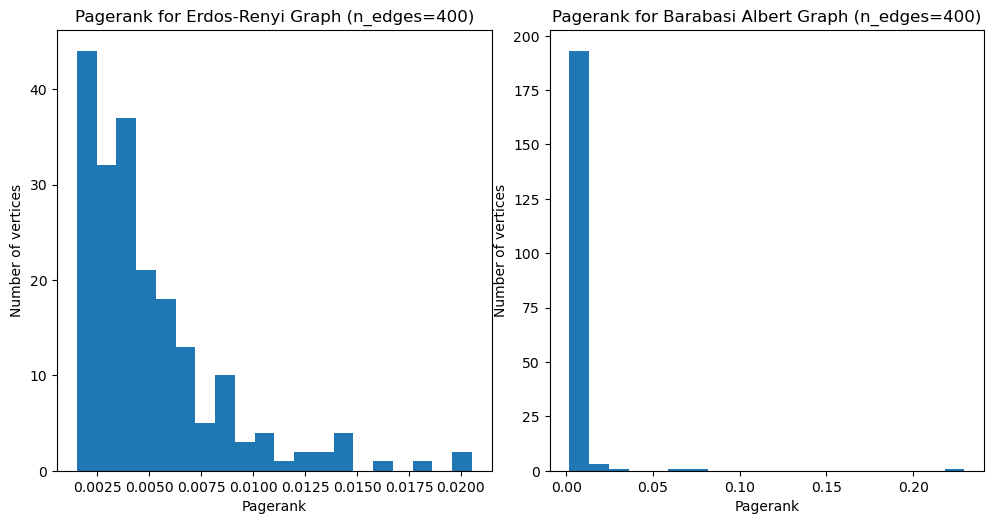

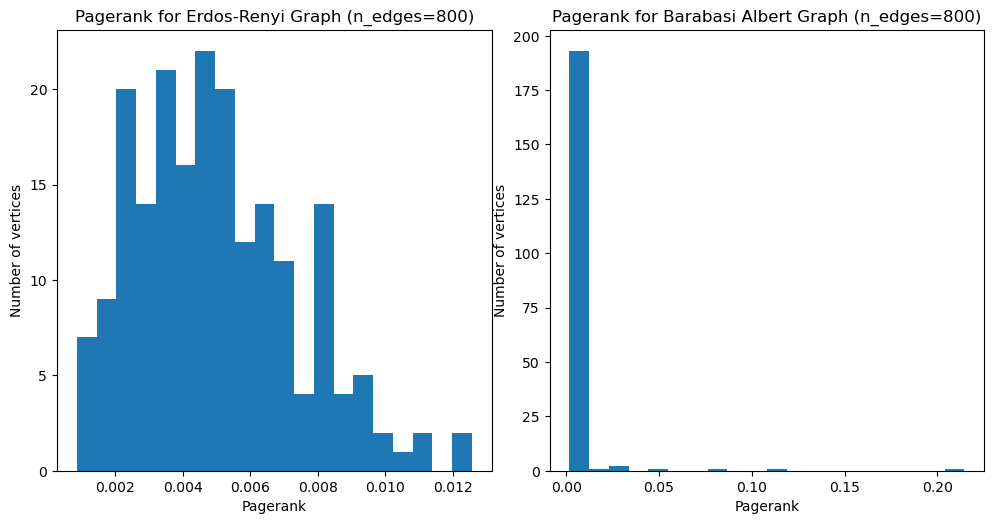

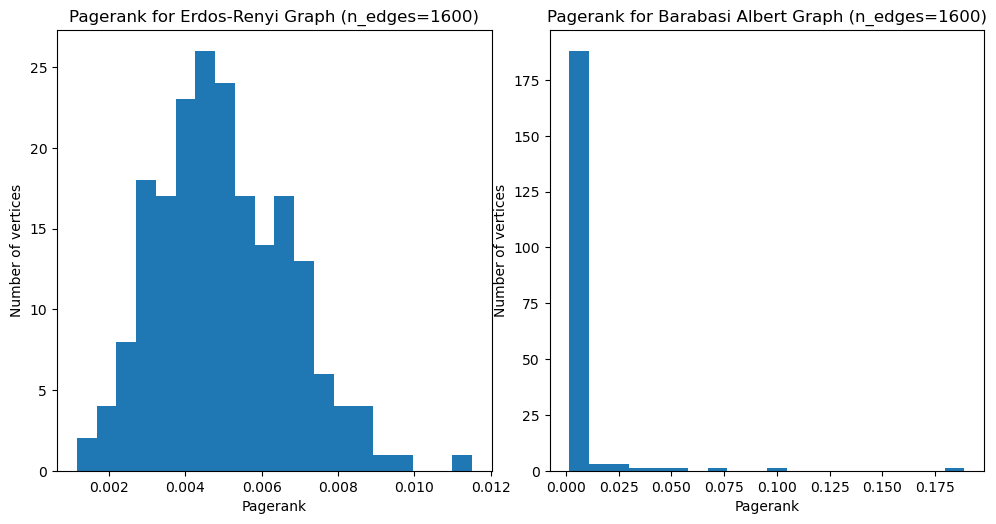

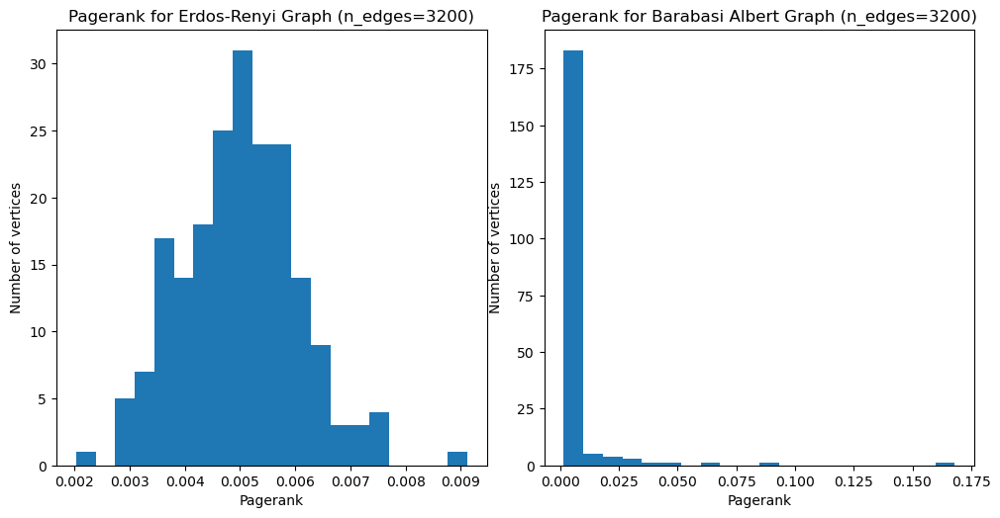

In [37]:
#   2. Demonstrate the different characteristics of the distribution of the page rank for the
#      Erdösz/Renyi model compared to the Barabasi/Albert graph model in an example
#      (e.g. generate random graph/s with similar number of nodes and edges for each model,
#      compute page rank and compare characteristics of the resulting value distribution
#      such as moments)

from graph_tool.all import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def directed_erdos_renyi_graph(number_vertices, number_edges, seed=0, directed=True):
    rng=np.random.default_rng(seed)
    g = Graph(directed=directed)
    list_vertices = list(g.add_vertex(number_vertices))
    list_edges = list()

    while number_edges > 0:
        v1, v2 = rng.choice(list_vertices, 2, replace=False)
        if not (v1, v2) in list_edges and (directed or not (v2, v1) in list_edges):
            list_edges.append((v1, v2))
            number_edges -= 1
            g.add_edge(v1, v2)
    return g

def main():
    number_vertices = 200
    number_edges = [200,400,800,1600,3200]
    
    for n_edges in number_edges:
        erdos_renyi_graph = directed_erdos_renyi_graph(number_vertices, n_edges, seed=420)
        pr_erdos_renyi_graph = pagerank(erdos_renyi_graph)
        graph_draw(erdos_renyi_graph, vertex_fill_color=pr_erdos_renyi_graph, vertex_size=prop_to_size(pr_erdos_renyi_graph, mi=5, ma=15), vcmap=plt.cm.gist_heat)

        barabasi_albert_graph = price_network(number_vertices, n_edges / number_vertices)
        pr_barabasi_albert_graph = pagerank(barabasi_albert_graph)
        graph_draw(barabasi_albert_graph, vertex_fill_color=pr_barabasi_albert_graph, vertex_size=prop_to_size(pr_barabasi_albert_graph, mi=5, ma=15), vcmap=plt.cm.gist_heat)

        d = {'erdos_renyi' : pr_erdos_renyi_graph.get_array(), 'barabasi_albert' : pr_barabasi_albert_graph.get_array()}
        df = pd.DataFrame(d)
        print(df.describe())

        fig, axs = plt.subplots(1,2)
        fig.set_size_inches(10,5)
        fig.tight_layout()

        i = 0
        title = [f'Pagerank for Erdos-Renyi Graph (n_edges={n_edges})' ,f'Pagerank for Barabasi Albert Graph (n_edges={n_edges})']
        for model in d:
            counts, bins = np.histogram(d[model], bins=20)
            axs[i].stairs(counts, bins, fill=True)
            axs[i].set_ylabel('Number of vertices')
            axs[i].set_xlabel('Pagerank')
            axs[i].set_title(title[i])
            i += 1

if __name__ == '__main__':
    main()